# Problem Statement

You work for a consumer finance company which specializes in lending loans to urban customers. When the company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision: 
• If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company 
• If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company 

The data given below contains the information about past loan applicants and whether they ‘defaulted’4 or not. The aim is to identify patterns which indicate if a person is likely to default, which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. 

In this case study, you will use EDA to understand how consumer attributes and loan attributes influence the tendency of default. 

When a person applies for a loan, there are two types of decisions that could be taken by the company: 

1. Loan accepted: If the company approves the loan, there are 3 possible scenarios described below: 
o Fully paid: Applicant has fully paid the loan (the principal and the interest rate) 
o Current: Applicant is in the process of paying the instalments, i.e. the tenure of the loan is not yet completed. These candidates are not labelled as 'defaulted'. 
o Charged-off: Applicant has not paid the instalments in due time for a long period of time, i.e. he/she has defaulted on the loan  
2. Loan rejected: The company had rejected the loan (because the candidate does not meet their requirements etc.). Since the loan was rejected, there is no transactional history of those applicants with the company and so this data is not available with the company (and thus in this dataset)

This company is the largest online loan marketplace, facilitating personal loans, business loans, and financing of medical procedures. Borrowers can easily access lower interest rate loans through an online interface.  
 Like most other lending companies, lending loans to ‘risky’ applicants is the largest source of financial loss (called credit loss). The credit loss is the amount of money lost by the lender when the borrower refuses to pay or runs away with the money owed. In other words, borrowers who default cause the largest amount of loss to the lenders. In this case, the customers labelled as 'charged-off' are the 'defaulters'.  
 If one is able to identify these risky loan applicants, then such loans can be reduced thereby cutting down the amount of credit loss. 
In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilize this knowledge for its portfolio and risk assessment.  

Perform Multinomial regression on the dataset in which loan_status is the output (Y) variable and it has three levels in it. 


---- #####----

Lets load necessary libraries and dataset

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (10,10)

In [44]:
data = pd.read_csv('loan.csv')
data.shape

C:\Users\jaic208\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (47) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


(39717, 111)

We have 39717 rows and 111 columns, there are lot of columns lets see how many values do we have in each column

In [45]:
data.nunique()

id                            39717
member_id                     39717
loan_amnt                       885
funded_amnt                    1041
funded_amnt_inv                8205
                              ...  
tax_liens                         1
tot_hi_cred_lim                   0
total_bal_ex_mort                 0
total_bc_limit                    0
total_il_high_credit_limit        0
Length: 111, dtype: int64

Seems like we have some columns which have either 1 or 0 attributes in them, we will drop these columns as they do not provide any relevant information for analysis, along with id column as we have member_id to classify our dataset

In [46]:
backup = data


In [47]:
data.dropna(axis=1,inplace=True)
data

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,policy_code,application_type,acc_now_delinq,delinq_amnt
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,5000.00,863.16,0.00,0.00,0.00,171.62,1,INDIVIDUAL,0,0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,456.46,435.17,0.00,117.08,1.11,119.66,1,INDIVIDUAL,0,0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,2400.00,605.67,0.00,0.00,0.00,649.91,1,INDIVIDUAL,0,0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,10000.00,2214.92,16.97,0.00,0.00,357.48,1,INDIVIDUAL,0,0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,2475.94,1037.39,0.00,0.00,0.00,67.79,1,INDIVIDUAL,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92187,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,...,2500.00,322.97,0.00,0.00,0.00,80.90,1,INDIVIDUAL,0,0
39713,90665,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,...,8500.00,1413.49,0.00,0.00,0.00,281.94,1,INDIVIDUAL,0,0
39714,90395,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,...,5000.00,272.16,0.00,0.00,0.00,0.00,1,INDIVIDUAL,0,0
39715,90376,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,...,5000.00,174.20,0.00,0.00,0.00,0.00,1,INDIVIDUAL,0,0


In [54]:
data.nunique()

id                         39717
member_id                  39717
loan_amnt                    885
funded_amnt                 1041
funded_amnt_inv             8205
term                           2
int_rate                     371
installment                15383
grade                          7
sub_grade                     35
home_ownership                 5
annual_inc                  5318
verification_status            3
issue_d                       55
loan_status                    3
pymnt_plan                     1
url                        39717
purpose                       14
zip_code                     823
addr_state                    50
dti                         2868
delinq_2yrs                   11
earliest_cr_line             526
inq_last_6mths                 9
open_acc                      40
pub_rec                        5
revol_bal                  21711
total_acc                     82
initial_list_status            1
out_prncp                   1137
out_prncp_

In [63]:
columns_to_drop = data.nunique()[data.nunique()==1].index
columns_to_drop

Index(['pymnt_plan', 'initial_list_status', 'policy_code', 'application_type',
       'acc_now_delinq', 'delinq_amnt'],
      dtype='object')

In [64]:
data.drop(columns=columns_to_drop,inplace=True)
data

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,119.66
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92187,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,...,0.00,0.00,2822.969293,1213.88,2500.00,322.97,0.00,0.00,0.00,80.90
39713,90665,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,...,0.00,0.00,9913.491822,1020.51,8500.00,1413.49,0.00,0.00,0.00,281.94
39714,90395,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,...,0.00,0.00,5272.161128,1397.12,5000.00,272.16,0.00,0.00,0.00,0.00
39715,90376,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,...,0.00,0.00,5174.198551,672.66,5000.00,174.20,0.00,0.00,0.00,0.00


We have further reduced our columns from 43 to 37

In [65]:
data.drop(columns='id',inplace=True)
data

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,home_ownership,...,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt
0,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,RENT,...,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62
1,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,RENT,...,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,119.66
2,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,RENT,...,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91
3,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,RENT,...,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48
4,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,RENT,...,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,MORTGAGE,...,0.00,0.00,2822.969293,1213.88,2500.00,322.97,0.00,0.00,0.00,80.90
39713,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,RENT,...,0.00,0.00,9913.491822,1020.51,8500.00,1413.49,0.00,0.00,0.00,281.94
39714,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,MORTGAGE,...,0.00,0.00,5272.161128,1397.12,5000.00,272.16,0.00,0.00,0.00,0.00
39715,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,MORTGAGE,...,0.00,0.00,5174.198551,672.66,5000.00,174.20,0.00,0.00,0.00,0.00


In [66]:
data.columns

Index(['member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term',
       'int_rate', 'installment', 'grade', 'sub_grade', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'url',
       'purpose', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_amnt'],
      dtype='object')

There are some columns which we may not need like url, purpose, zipcode, addr_state

In [67]:
data.dtypes

member_id                    int64
loan_amnt                    int64
funded_amnt                  int64
funded_amnt_inv            float64
term                        object
int_rate                    object
installment                float64
grade                       object
sub_grade                   object
home_ownership              object
annual_inc                 float64
verification_status         object
issue_d                     object
loan_status                 object
url                         object
purpose                     object
zip_code                    object
addr_state                  object
dti                        float64
delinq_2yrs                  int64
earliest_cr_line            object
inq_last_6mths               int64
open_acc                     int64
pub_rec                      int64
revol_bal                    int64
total_acc                    int64
out_prncp                  float64
out_prncp_inv              float64
total_pymnt         

We are making a list of columns which needs to dropped further as they do not provide any relevant information for our prediction

In [68]:
data.columns

Index(['member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term',
       'int_rate', 'installment', 'grade', 'sub_grade', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'url',
       'purpose', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_amnt'],
      dtype='object')

In [69]:
columns_to_drop = ['url','zip_code','addr_state','earliest_cr_line']
data.drop(columns=columns_to_drop,inplace=True)
data

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,home_ownership,...,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt
0,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,RENT,...,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62
1,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,RENT,...,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,119.66
2,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,RENT,...,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91
3,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,RENT,...,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48
4,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,RENT,...,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,MORTGAGE,...,0.00,0.00,2822.969293,1213.88,2500.00,322.97,0.00,0.00,0.00,80.90
39713,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,RENT,...,0.00,0.00,9913.491822,1020.51,8500.00,1413.49,0.00,0.00,0.00,281.94
39714,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,MORTGAGE,...,0.00,0.00,5272.161128,1397.12,5000.00,272.16,0.00,0.00,0.00,0.00
39715,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,MORTGAGE,...,0.00,0.00,5174.198551,672.66,5000.00,174.20,0.00,0.00,0.00,0.00


In [73]:
data.dtypes

member_id                    int64
loan_amnt                    int64
funded_amnt                  int64
funded_amnt_inv            float64
term                        object
int_rate                    object
installment                float64
grade                       object
sub_grade                   object
home_ownership              object
annual_inc                 float64
verification_status         object
issue_d                     object
loan_status                 object
purpose                     object
dti                        float64
delinq_2yrs                  int64
inq_last_6mths               int64
open_acc                     int64
pub_rec                      int64
revol_bal                    int64
total_acc                    int64
out_prncp                  float64
out_prncp_inv              float64
total_pymnt                float64
total_pymnt_inv            float64
total_rec_prncp            float64
total_rec_int              float64
total_rec_late_fee  

In [126]:
data.columns

Index(['member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term',
       'int_rate', 'installment', 'grade', 'sub_grade', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status',
       'purpose', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_amnt'],
      dtype='object')

In [128]:
new_data = data[['loan_status','member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term',
       'int_rate', 'installment', 'grade', 'sub_grade', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d','purpose', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_amnt']]
new_data

,loan_status,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt
0,2,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62
1,0,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,119.66
2,2,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91
3,2,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48
4,1,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,2,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,...,0.00,0.00,2822.969293,1213.88,2500.00,322.97,0.00,0.00,0.00,80.90
39713,2,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,...,0.00,0.00,9913.491822,1020.51,8500.00,1413.49,0.00,0.00,0.00,281.94
39714,2,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,...,0.00,0.00,5272.161128,1397.12,5000.00,272.16,0.00,0.00,0.00,0.00
39715,2,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,...,0.00,0.00,5174.198551,672.66,5000.00,174.20,0.00,0.00,0.00,0.00


In [76]:
objs = data.select_dtypes(include=[object])
objs

,term,int_rate,grade,sub_grade,home_ownership,verification_status,issue_d,loan_status,purpose
0,36 months,10.65%,B,B2,RENT,Verified,Dec-11,Fully Paid,credit_card
1,60 months,15.27%,C,C4,RENT,Source Verified,Dec-11,Charged Off,car
2,36 months,15.96%,C,C5,RENT,Not Verified,Dec-11,Fully Paid,small_business
3,36 months,13.49%,C,C1,RENT,Source Verified,Dec-11,Fully Paid,other
4,60 months,12.69%,B,B5,RENT,Source Verified,Dec-11,Current,other
...,...,...,...,...,...,...,...,...,...
39712,36 months,8.07%,A,A4,MORTGAGE,Not Verified,Jul-07,Fully Paid,home_improvement
39713,36 months,10.28%,C,C1,RENT,Not Verified,Jul-07,Fully Paid,credit_card
39714,36 months,8.07%,A,A4,MORTGAGE,Not Verified,Jul-07,Fully Paid,debt_consolidation
39715,36 months,7.43%,A,A2,MORTGAGE,Not Verified,Jul-07,Fully Paid,other


In [79]:
objs.sub_grade.value_counts()

B3    2917
A4    2886
A5    2742
B5    2704
B4    2512
C1    2136
B2    2057
C2    2011
B1    1830
A3    1810
C3    1529
A2    1508
D2    1348
C4    1236
C5    1186
D3    1173
A1    1139
D4     981
D1     931
D5     874
E1     763
E2     656
E3     553
E4     454
E5     416
F1     329
F2     249
F3     185
F4     168
F5     118
G1     104
G2      78
G4      56
G3      48
G5      30
Name: sub_grade, dtype: int64

In [81]:
objs.term.value_counts()/objs.shape[0]

 36 months    0.732583
 60 months    0.267417
Name: term, dtype: float64

73% of the data has term of 36 months and 27% is for 60 months

Fully Paid     0.829620
Charged Off    0.141677
Current        0.028703
Name: loan_status, dtype: float64


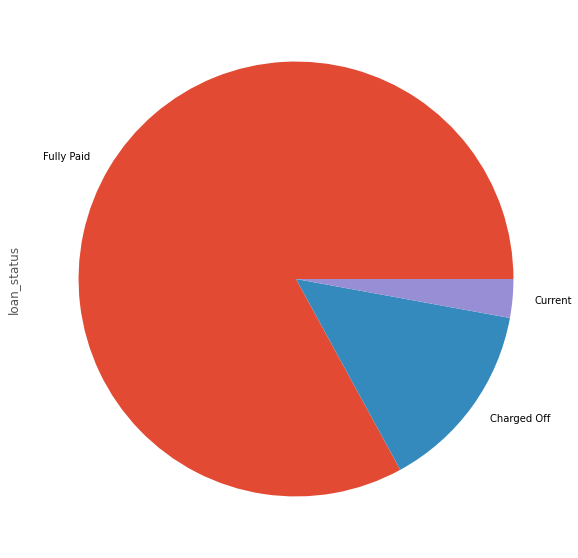

In [85]:
print(data['loan_status'].value_counts()/data.shape[0])
(data['loan_status'].value_counts()/data.shape[0]).plot(kind='pie')

83% of Loan is Fully Paid, 14% is Charged Off and 3% is Current

term          36 months   60 months
loan_status                        
Charged Off        3227        2400
Current               0        1140
Fully Paid        25869        7081


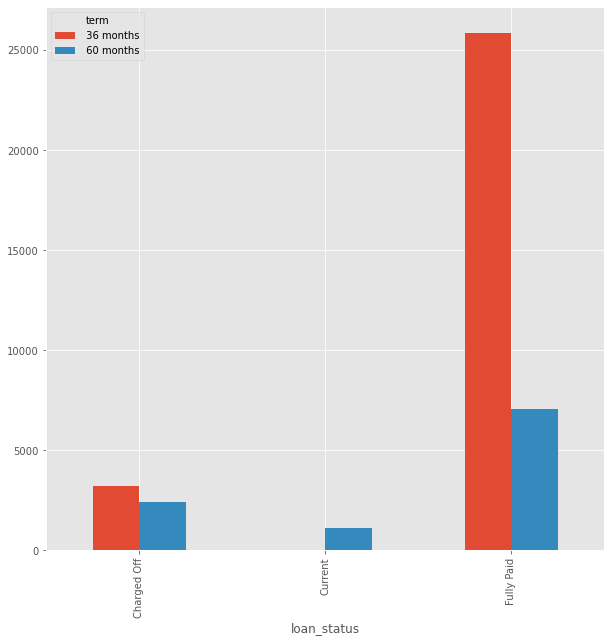

In [88]:
print(pd.crosstab(data['loan_status'],data['term']))
pd.crosstab(data['loan_status'],data['term']).plot(kind='bar')

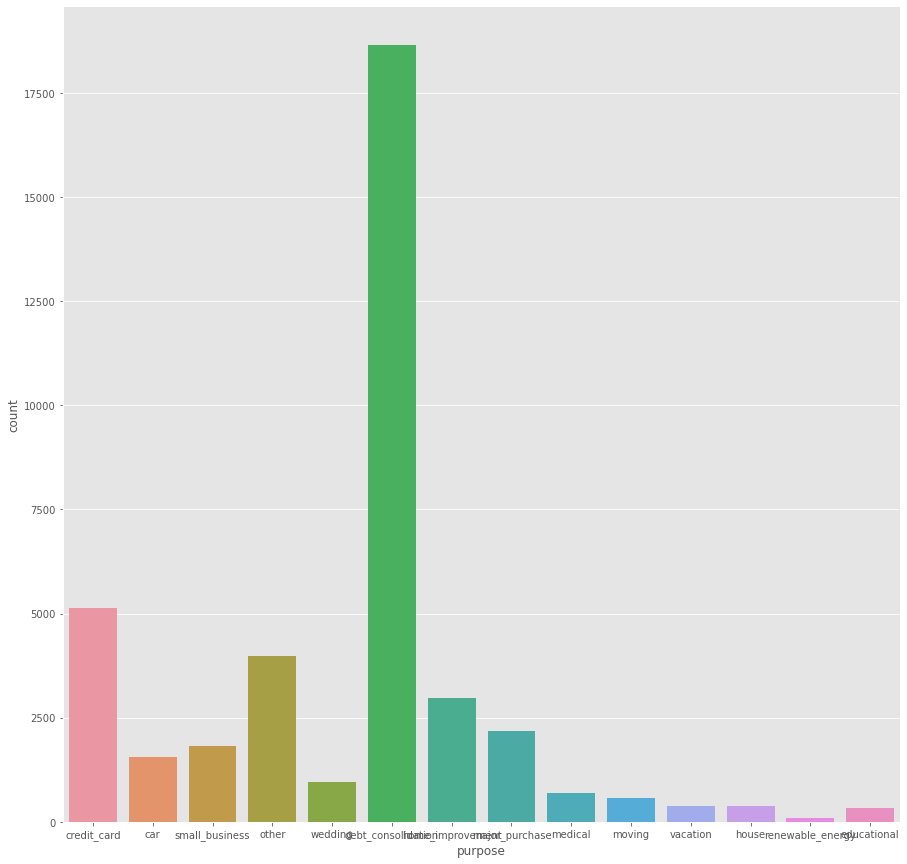

In [95]:
plt.rcParams['figure.figsize'] = (15,15)
sns.countplot(data['purpose'],orient="h")

In [96]:
data

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,home_ownership,...,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt
0,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,RENT,...,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62
1,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,RENT,...,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,119.66
2,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,RENT,...,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91
3,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,RENT,...,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48
4,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,RENT,...,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,MORTGAGE,...,0.00,0.00,2822.969293,1213.88,2500.00,322.97,0.00,0.00,0.00,80.90
39713,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,RENT,...,0.00,0.00,9913.491822,1020.51,8500.00,1413.49,0.00,0.00,0.00,281.94
39714,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,MORTGAGE,...,0.00,0.00,5272.161128,1397.12,5000.00,272.16,0.00,0.00,0.00,0.00
39715,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,MORTGAGE,...,0.00,0.00,5174.198551,672.66,5000.00,174.20,0.00,0.00,0.00,0.00


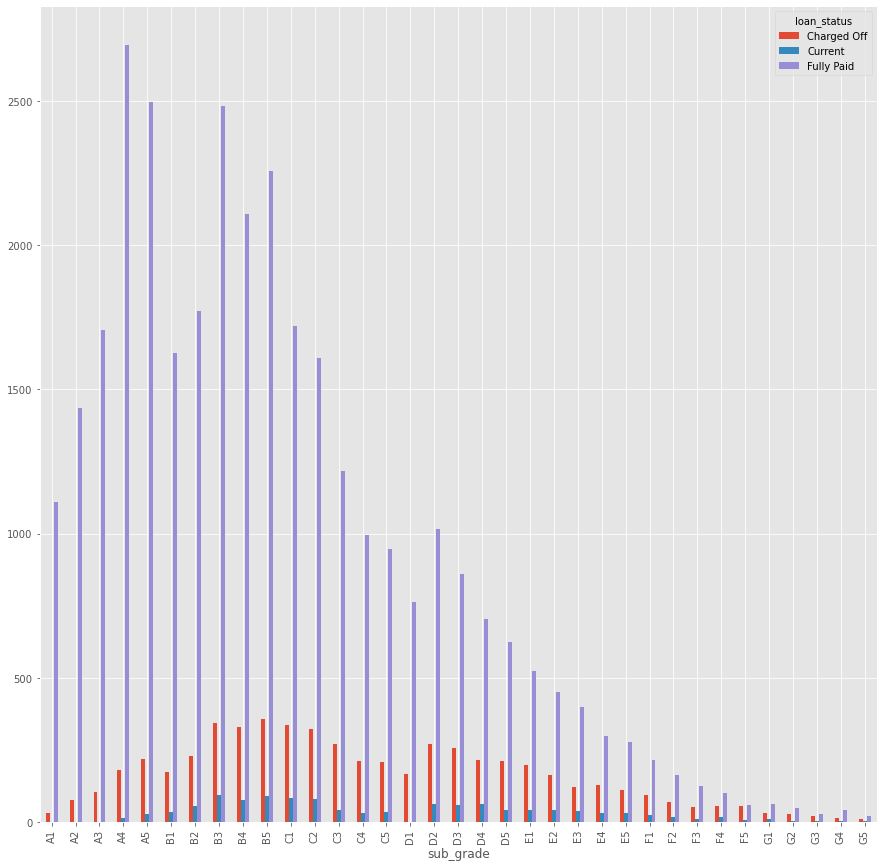

In [99]:
pd.crosstab(data['sub_grade'],data['loan_status']).plot(kind='bar')

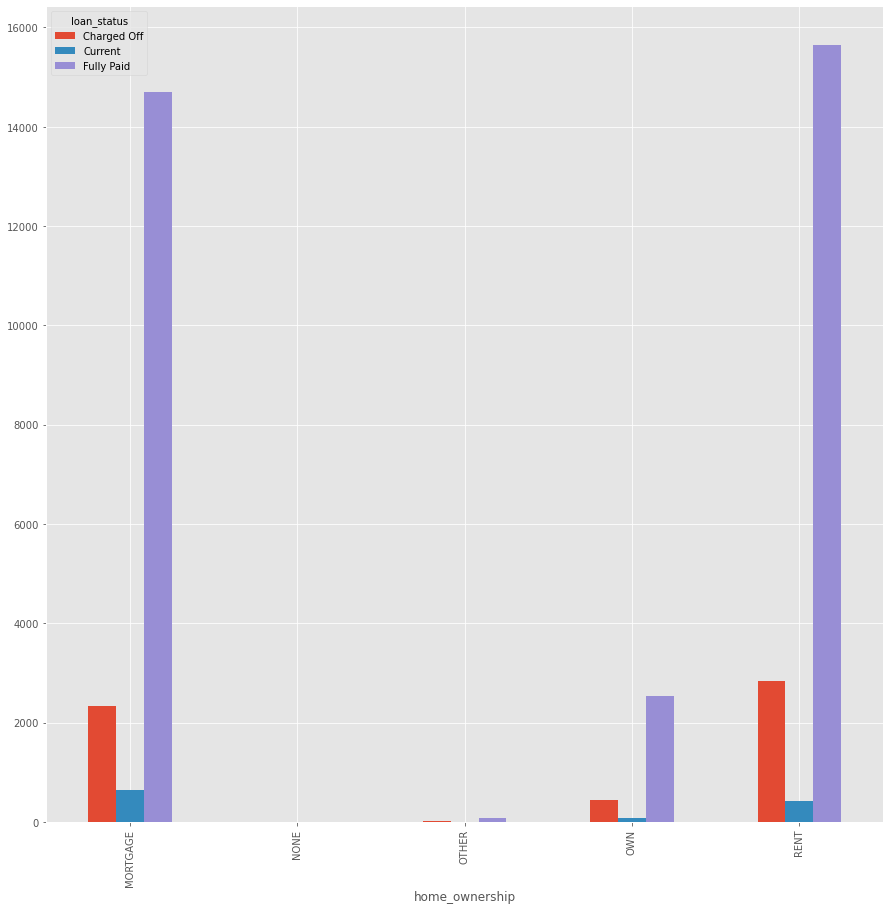

In [101]:
pd.crosstab(data['home_ownership'],data['loan_status']).plot(kind='bar')

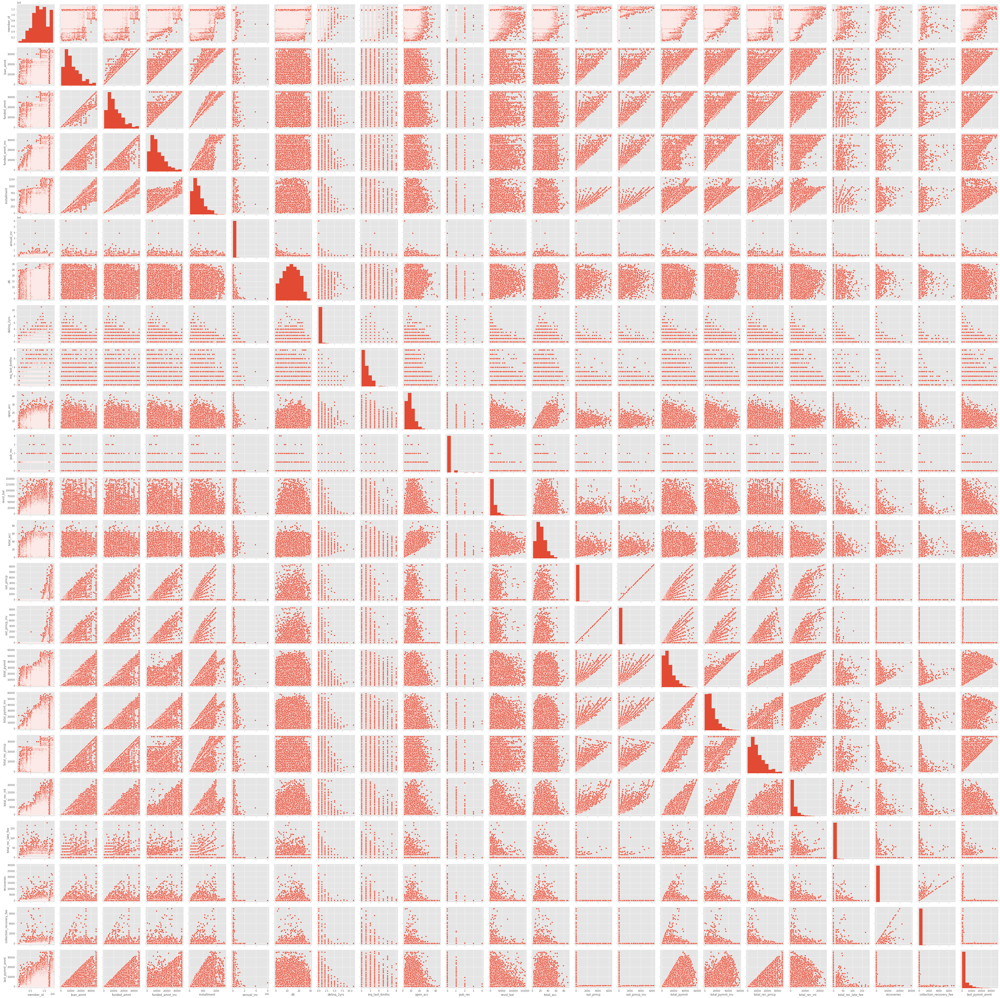

In [102]:
sns.pairplot(data)

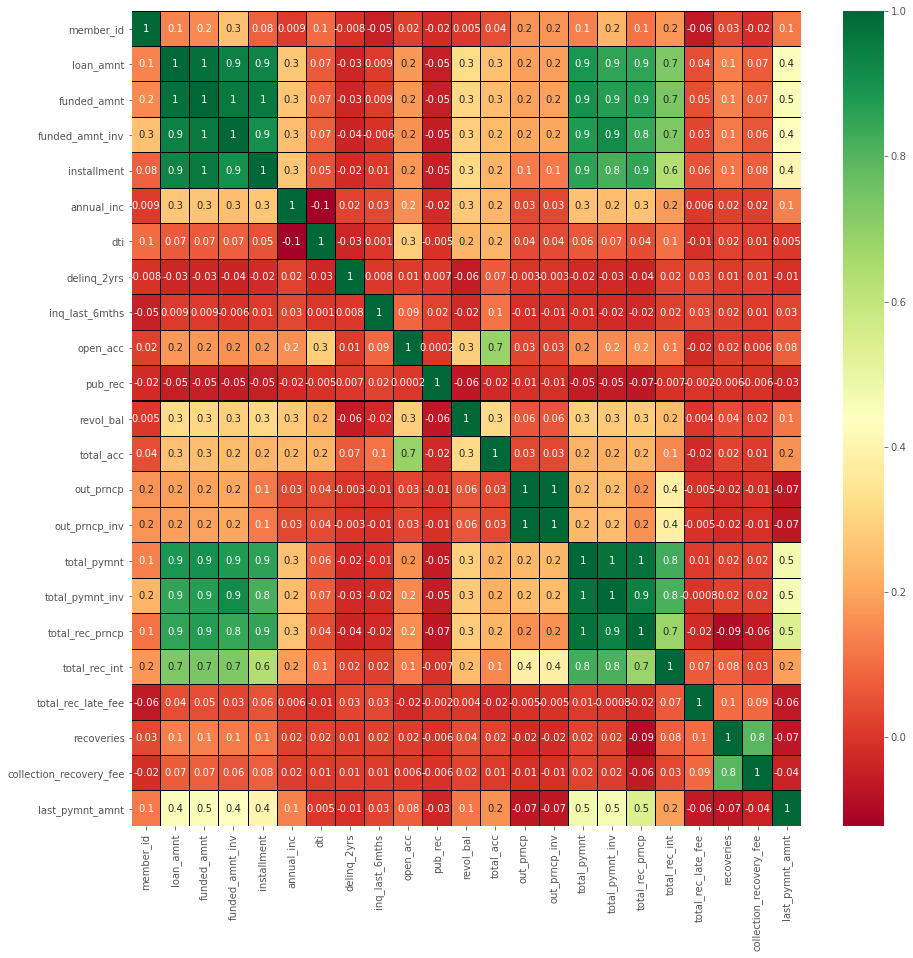

In [109]:
sns.heatmap(data.corr(),cmap='RdYlGn',linecolor='black',linewidths=0.02,annot=True,fmt='.01g')

Lets build our model

In [129]:
backup = new_data

In [111]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()

In [113]:
data['loan_status'] = labelencoder.fit_transform(data['loan_status'])
data['loan_status'].value_counts()

2    32950
0     5627
1     1140
Name: loan_status, dtype: int64

2 is Fully Paid, 0 is Charged Off, and 1 is Current

In [130]:
new_data1 = pd.get_dummies(new_data,drop_first=True)
new_data1

,loan_status,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
0,2,1296599,5000,5000,4975.0,162.87,24000.0,27.65,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,1314167,2500,2500,2500.0,59.83,30000.0,1.00,0,5,...,0,0,0,0,0,0,0,0,0,0
2,2,1313524,2400,2400,2400.0,84.33,12252.0,8.72,0,2,...,0,0,0,0,0,0,0,1,0,0
3,2,1277178,10000,10000,10000.0,339.31,49200.0,20.00,0,1,...,0,0,0,0,0,1,0,0,0,0
4,1,1311748,3000,3000,3000.0,67.79,80000.0,17.94,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,2,92174,2500,2500,1075.0,78.42,110000.0,11.33,0,0,...,1,0,0,0,0,0,0,0,0,0
39713,2,90607,8500,8500,875.0,275.38,18000.0,6.40,1,1,...,0,0,0,0,0,0,0,0,0,0
39714,2,90390,5000,5000,1325.0,156.84,100000.0,2.30,0,0,...,0,0,0,0,0,0,0,0,0,0
39715,2,89243,5000,5000,650.0,155.38,200000.0,3.72,0,0,...,0,0,0,0,0,1,0,0,0,0


In [131]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [133]:
train, test = train_test_split(new_data1, test_size = 0.3)

In [134]:
# ‘multinomial’ option is supported only by the ‘lbfgs’ and ‘newton-cg’ solvers
model = LogisticRegression(multi_class='multinomial', solver = 'lbfgs').fit(train.iloc[:,1:],train.iloc[:,0])
test_predict = model.predict(test.iloc[:,1:])

C:\Users\jaic208\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [135]:
# Test accuracy 
accuracy_score(test.iloc[:,0], test_predict)

0.9699563611950319

In [136]:
train_predict = model.predict(train.iloc[:, 1:]) # Train predictions 
# Train accuracy 
accuracy_score(train.iloc[:,0], train_predict)

0.9671594546958743

In [141]:
# ‘multinomial’ option is supported only by the ‘lbfgs’ and ‘newton-cg’ solvers
model1 = LogisticRegression(multi_class='multinomial', solver = 'newton-cg').fit(train.iloc[:,1:],train.iloc[:,0])
test_predict = model1.predict(test.iloc[:,1:])

C:\Users\jaic208\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn("newton-cg failed to converge. Increase the "


In [142]:
# Test accuracy 
accuracy_score(test.iloc[:,0], test_predict)

0.9995803961060759

In [144]:
train_predict = model1.predict(train.iloc[:, 1:]) # Train predictions 
# Train accuracy 
accuracy_score(train.iloc[:,0], train_predict)

0.9995683608503291